# In this notebook I create and save the spectra for the data, by using a bigger ROI including all sample, to test for potential differences

In [48]:
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import pandas as pd
from astropy.io import fits
import os, fnmatch
from os import listdir
#%matplotlib inline
%matplotlib notebook
import scipy.signal
import matplotlib.patches as patches
from skimage.filters import threshold_otsu
from scipy.stats import binned_statistic
from scipy.signal import resample
import TOF_routines
from TOF_routines import tof2l, l2tof
from skimage import io

In [4]:

# here now I put the number obtained from the flight-path calibration!
t0 =  0.0002466
L = 56.065
lambda0 = 0.017
dL = 0

In [6]:
rootpath = '/media/carminati_c/Data2/IMAT_Nov2018/03_VerticalSetting_3hruns/'
coll_dir = sorted(fnmatch.filter(listdir(rootpath),'Sample*'))
print(coll_dir)
pathOB= "/media/carminati_c/Data2/IMAT_Nov2018/03_VerticalSetting_3hruns/Flat1_Corrected/"
myTOF = np.genfromtxt('/media/carminati_c/Data2/IMAT_Nov2018/03_VerticalSetting_3hruns/Flat1_Corrected/IMAT00010433_VerticalSetting_2hruns_000_Spectra.txt', usecols=0)

['Sample_10090deg_Corrected', 'Sample_10099deg_Corrected', 'Sample_10108deg_Corrected', 'Sample_10117deg_Corrected', 'Sample_10126deg_Corrected', 'Sample_10135deg_Corrected', 'Sample_10144deg_Corrected', 'Sample_10153deg_Corrected', 'Sample_10162deg_Corrected', 'Sample_10171deg_Corrected', 'Sample_10180deg_Corrected']


In [7]:
coll_files=[]
for i in range(0, len(coll_dir)):
# for i in range(0, 1):
    pathdata = rootpath + coll_dir[i]
    print(pathdata)
    coll_files.append(sorted(fnmatch.filter(listdir(pathdata),'*.fits')))

obfiles = fnmatch.filter(listdir(pathOB),'*.fits') # here there are several OB folders
coll_ob = sorted(obfiles)

/media/carminati_c/Data2/IMAT_Nov2018/03_VerticalSetting_3hruns/Sample_10090deg_Corrected
/media/carminati_c/Data2/IMAT_Nov2018/03_VerticalSetting_3hruns/Sample_10099deg_Corrected
/media/carminati_c/Data2/IMAT_Nov2018/03_VerticalSetting_3hruns/Sample_10108deg_Corrected
/media/carminati_c/Data2/IMAT_Nov2018/03_VerticalSetting_3hruns/Sample_10117deg_Corrected
/media/carminati_c/Data2/IMAT_Nov2018/03_VerticalSetting_3hruns/Sample_10126deg_Corrected
/media/carminati_c/Data2/IMAT_Nov2018/03_VerticalSetting_3hruns/Sample_10135deg_Corrected
/media/carminati_c/Data2/IMAT_Nov2018/03_VerticalSetting_3hruns/Sample_10144deg_Corrected
/media/carminati_c/Data2/IMAT_Nov2018/03_VerticalSetting_3hruns/Sample_10153deg_Corrected
/media/carminati_c/Data2/IMAT_Nov2018/03_VerticalSetting_3hruns/Sample_10162deg_Corrected
/media/carminati_c/Data2/IMAT_Nov2018/03_VerticalSetting_3hruns/Sample_10171deg_Corrected
/media/carminati_c/Data2/IMAT_Nov2018/03_VerticalSetting_3hruns/Sample_10180deg_Corrected


In [8]:
spectrum_ref1=np.zeros([len(coll_dir), len(coll_files[0])])
spectrum_ref2=np.zeros([len(coll_dir), len(coll_files[0])])
spectrum_stress1=np.zeros([len(coll_dir), len(coll_files[0])])
spectrum_stress2=np.zeros([len(coll_dir), len(coll_files[0])])
spectrum_ob_ref1=np.zeros([len(coll_dir), len(coll_files[0])])
spectrum_ob_ref2=np.zeros([len(coll_dir), len(coll_files[0])])
spectrum_ob_stress1=np.zeros([len(coll_dir), len(coll_files[0])])
spectrum_ob_stress2=np.zeros([len(coll_dir), len(coll_files[0])])

In [9]:
ob_ratios=np.array([107423.0/121694.0, 107423.0/101050.0, 107423.0/107552.0, 107423.0/96412.0, 107423.0/101731.0, 107423.0/102485.0, 107423.0/97977.0, 107423.0/99884.0, 107423.0/99997.0, 107423.0/107397.0, 107423.0/99095.0] )
print(ob_ratios)

[0.88273046 1.06306779 0.99880058 1.11420777 1.05595148 1.04818266
 1.09641038 1.07547755 1.07426223 1.00024209 1.08404057]


<IPython.core.display.Javascript object>


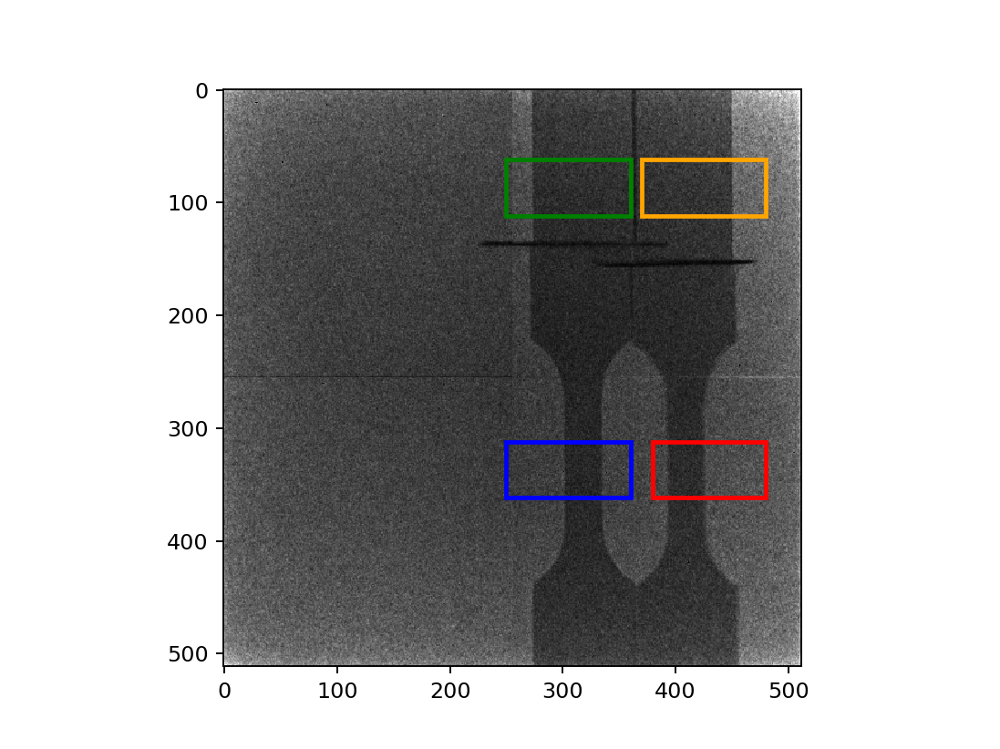

<IPython.core.display.Javascript object>


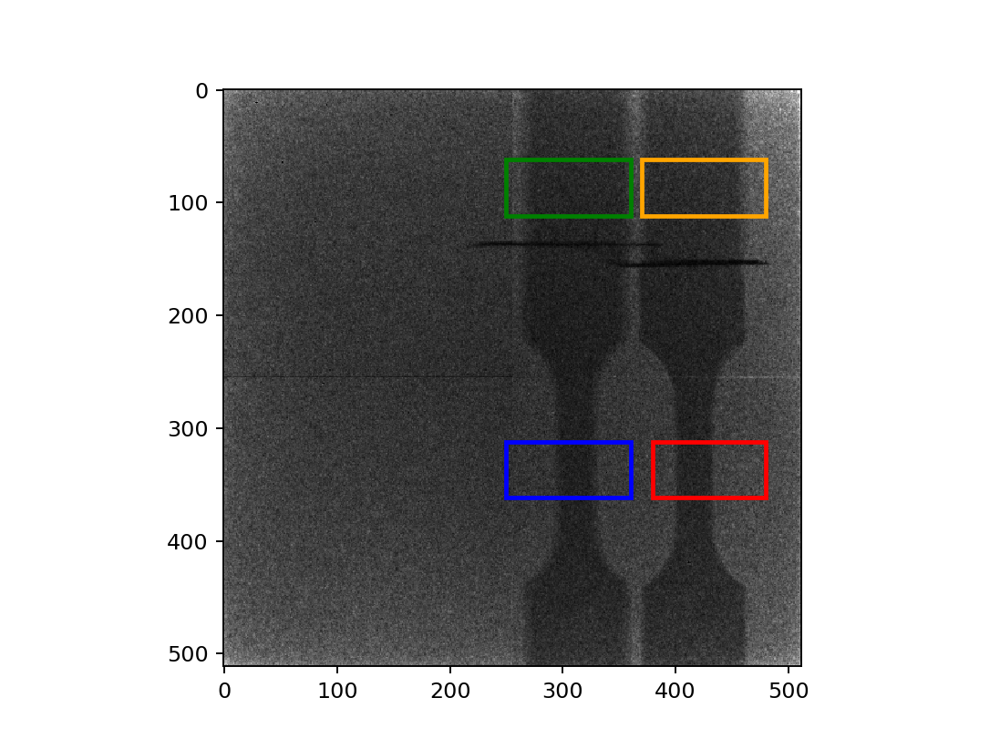

<IPython.core.display.Javascript object>


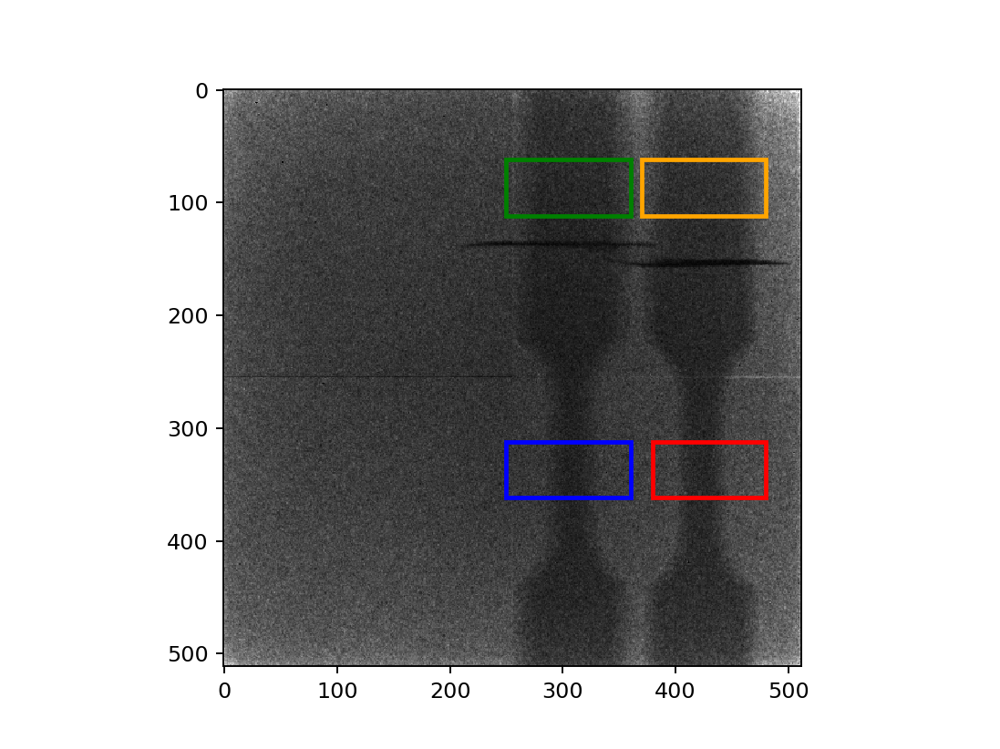

<IPython.core.display.Javascript object>


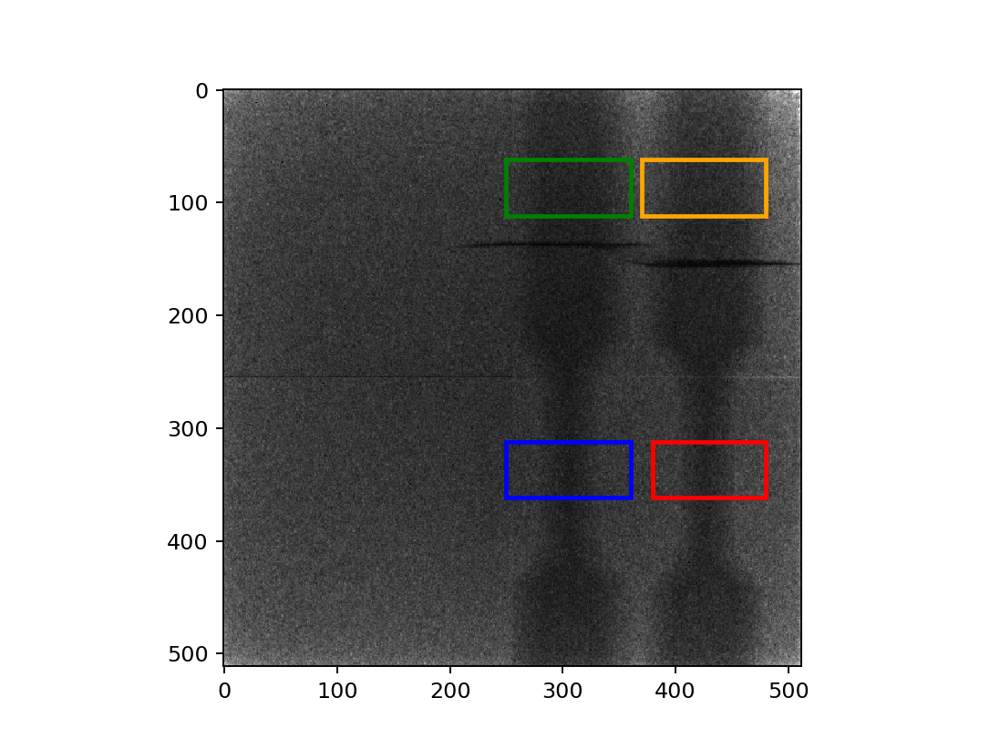

<IPython.core.display.Javascript object>


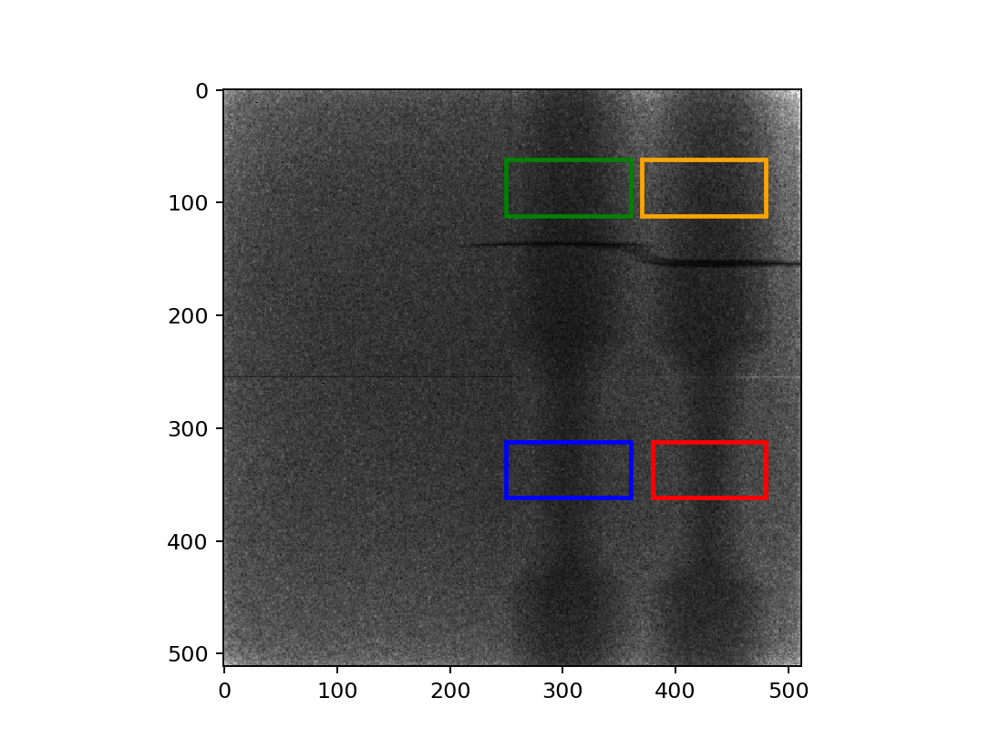

<IPython.core.display.Javascript object>


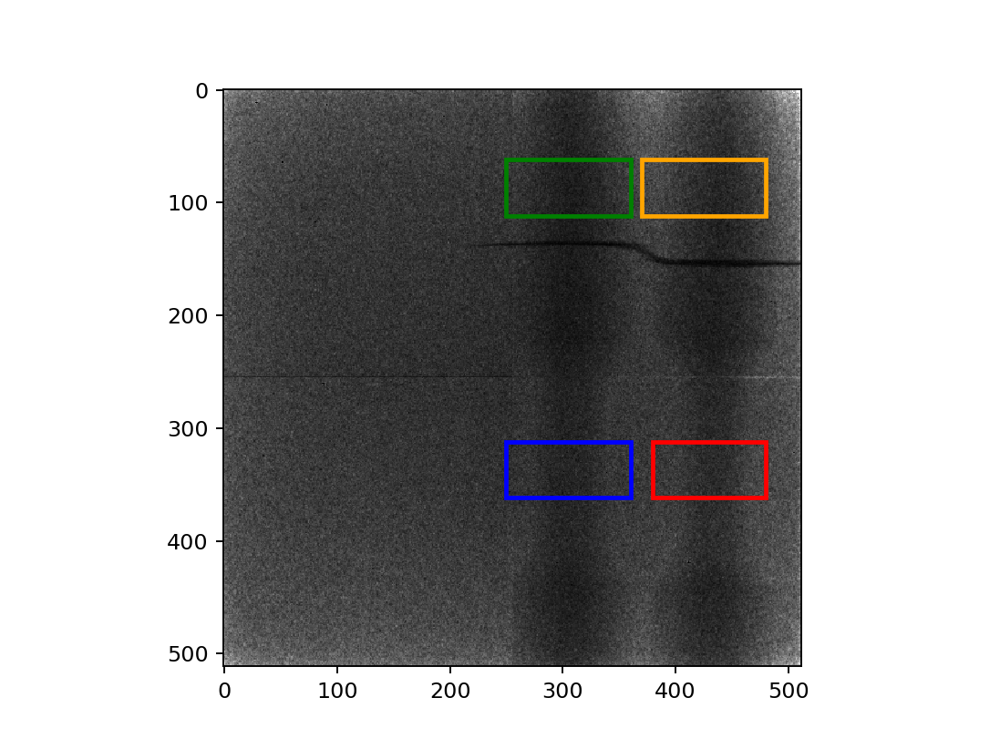

<IPython.core.display.Javascript object>


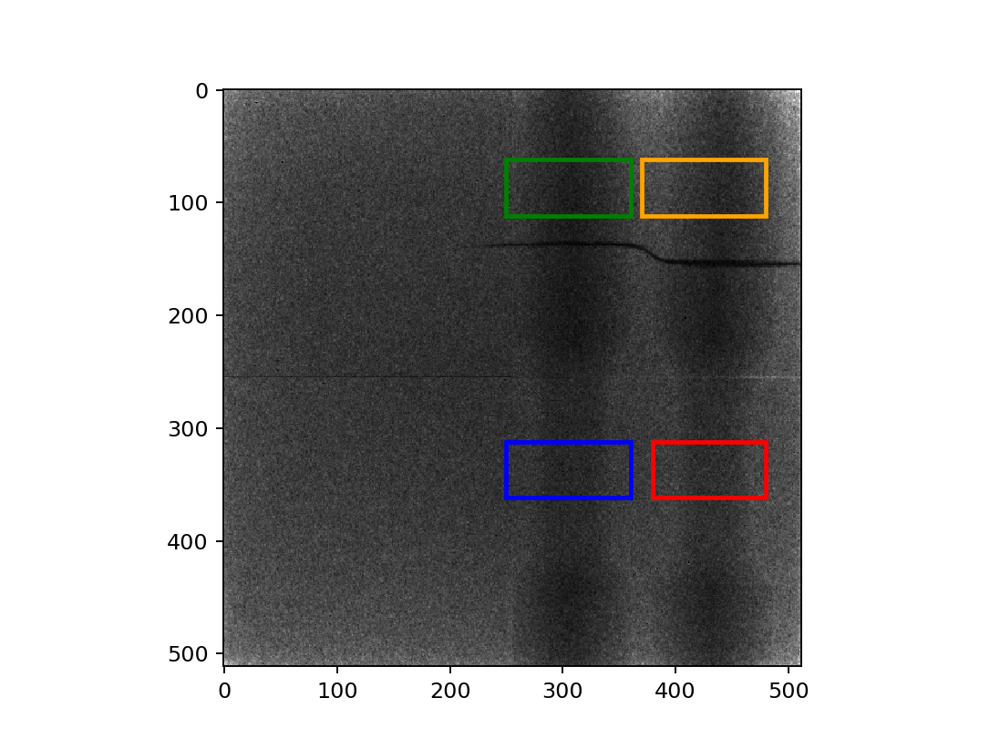

<IPython.core.display.Javascript object>


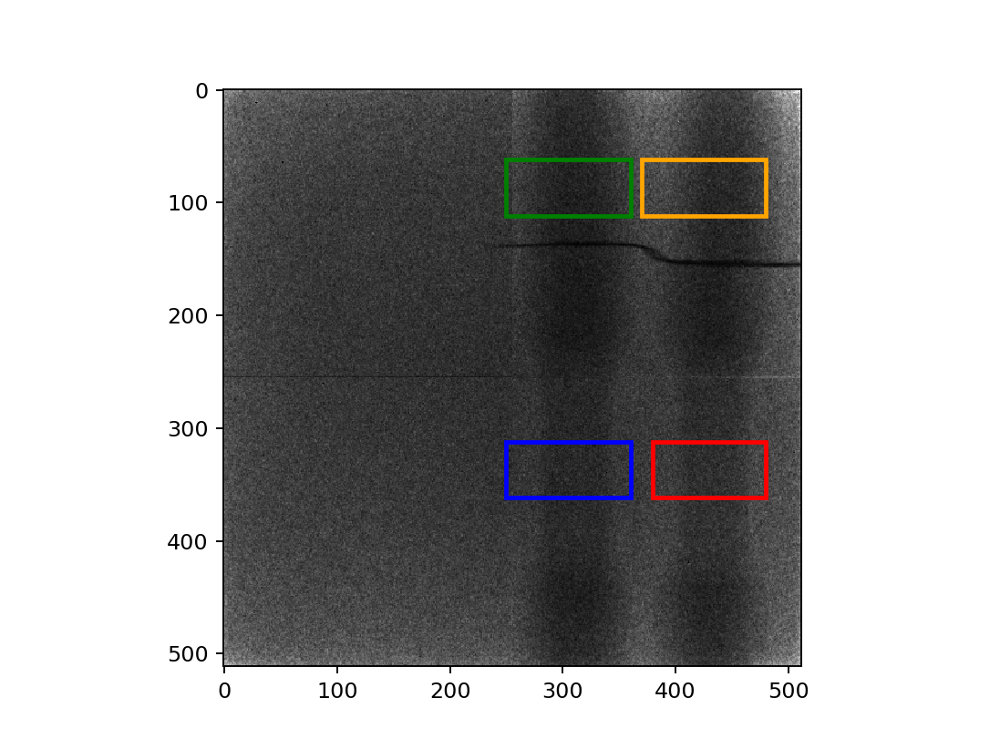

<IPython.core.display.Javascript object>


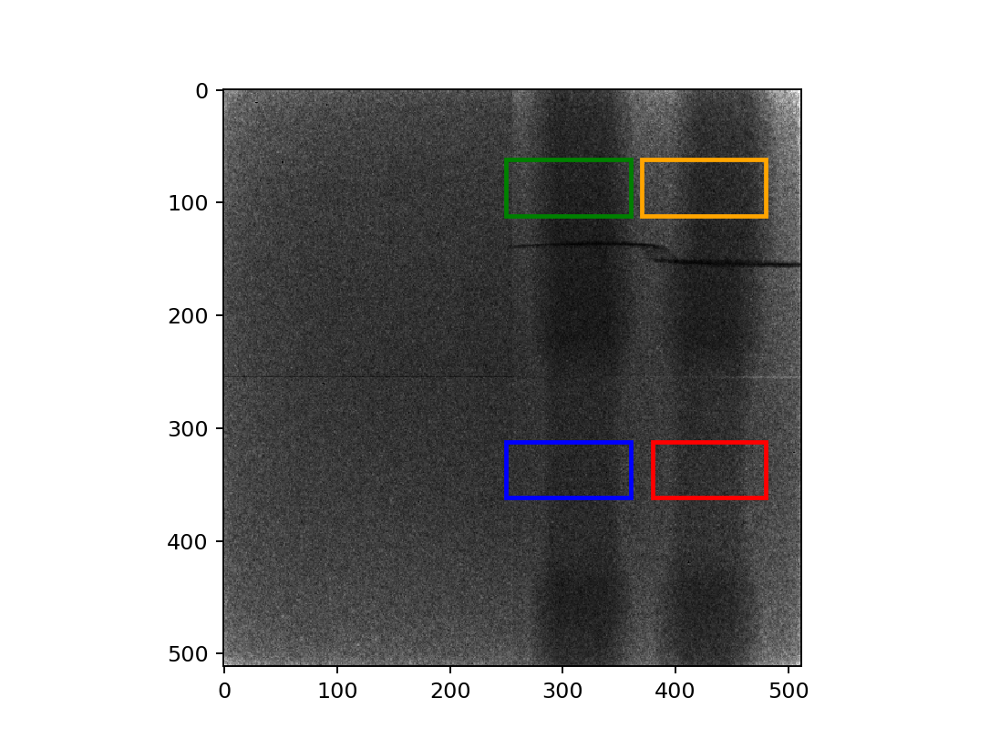

<IPython.core.display.Javascript object>


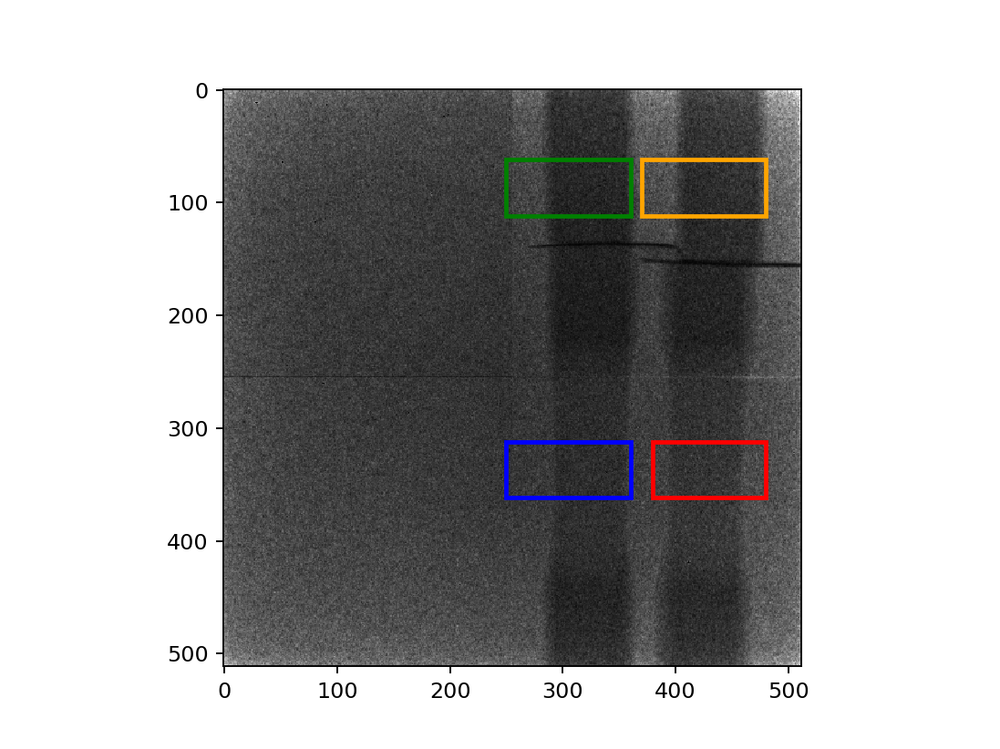

<IPython.core.display.Javascript object>


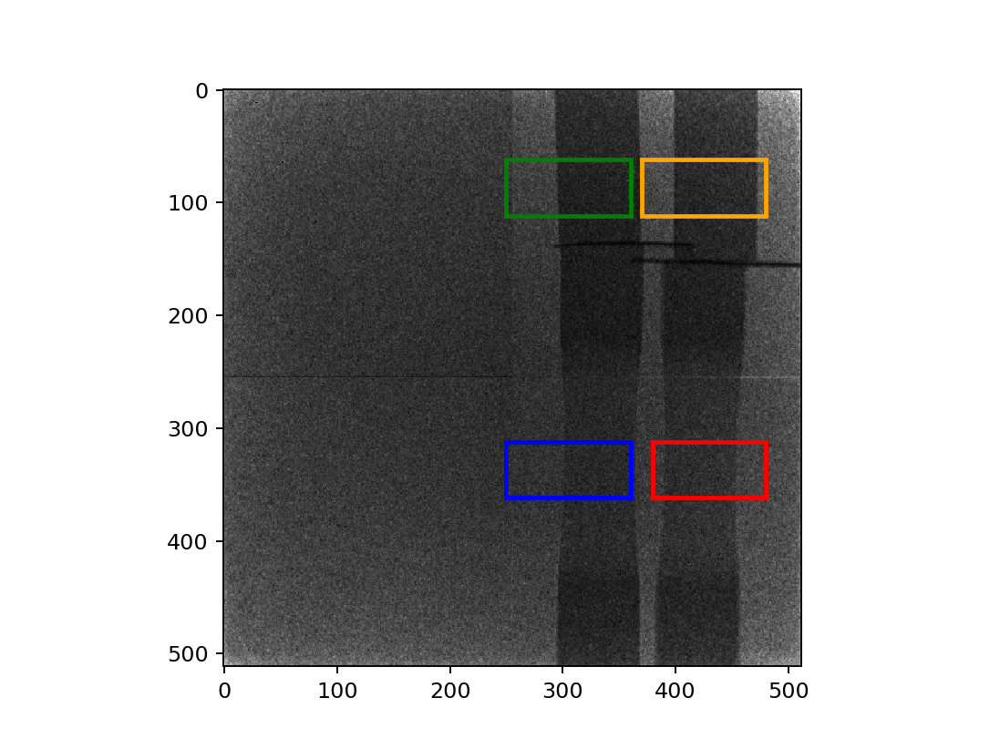

In [71]:
#This is now a bigger ROI to be used for each orientation, possibly combined with a mask

roi_stress1 = np.array([380,512-150,460,512-200])
roi_stress2 = np.array([250,512-150,360,512-200])
roi_ref1 = np.array([370,512-400,480,512-450])
roi_ref2 = np.array([250,512-400,360,512-450])


for i in range(0, len(coll_dir)):
    fig,ax =plt.subplots()
    value = rootpath + coll_dir[i]+'/'+coll_files[i][1500]
    with fits.open(value) as f:
        myim = (f[0].data) # load the image file, size is rows x columns (es. 512x512)

    ax.imshow(np.rot90(myim), vmin=0, vmax=200, cmap="gray")

    roi1= patches.Polygon([(380,512-150),(380,512-200),(480,512-200),(480,512-150)], edgecolor='red', facecolor='none',  linewidth=2)
    ax.add_patch(roi1)
    roi2= patches.Polygon([(250, 512-150),(250, 512-200),(360,512-200),(360, 512-150)], edgecolor='blue', facecolor='none',  linewidth=2)
    ax.add_patch(roi2)

    roi3= patches.Polygon([(370,512-450),(370,512-400),(480,512-400),(480,512-450)], edgecolor='orange', facecolor='none',  linewidth=2)
    ax.add_patch(roi3)
    roi4= patches.Polygon([(250,512-450),(250,512-400),(360,512-400),(360,512-450)], edgecolor='green', facecolor='none',  linewidth=2)
    ax.add_patch(roi4)

    
    
    
# roi_stress1 = np.array([150,380,200,460])
# roi_stress2 = np.array([150,250,200,360])
# roi_ref1 = np.array([400,370,450,480])
# roi_ref2 = np.array([400,250,450,360])

#     ax.imshow((myim), vmin=0, vmax=200, cmap="gray")
#     roi1= patches.Polygon([(150,380),(200,380),(200,460),(150,460)], edgecolor='red', facecolor='none',  linewidth=2)
#     ax.add_patch(roi1)
#     roi2= patches.Polygon([(150,250),(200,250),(200,360),(150,360)], edgecolor='blue', facecolor='none',  linewidth=2)
#     ax.add_patch(roi2)

#     roi3= patches.Polygon([(450,370),(400,370),(400,480),(450,480)], edgecolor='orange', facecolor='none',  linewidth=2)
#     ax.add_patch(roi3)
#     roi4= patches.Polygon([(450,250),(400,250),(400,360),(450,360)], edgecolor='green', facecolor='none',  linewidth=2)
#     ax.add_patch(roi4)


['Summed_img_0000.fits', 'Summed_img_0001.fits', 'Summed_img_0002.fits', 'Summed_img_0003.fits', 'Summed_img_0004.fits', 'Summed_img_0005.fits', 'Summed_img_0006.fits', 'Summed_img_0007.fits', 'Summed_img_0008.fits', 'Summed_img_0009.fits', 'Summed_img_0010.fits']


/home/carminati_c/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:17: RuntimeWarning: divide by zero encountered in true_divide
/home/carminati_c/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:17: RuntimeWarning: invalid value encountered in true_divide
/home/carminati_c/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RuntimeWarning: invalid value encountered in less


<IPython.core.display.Javascript object>


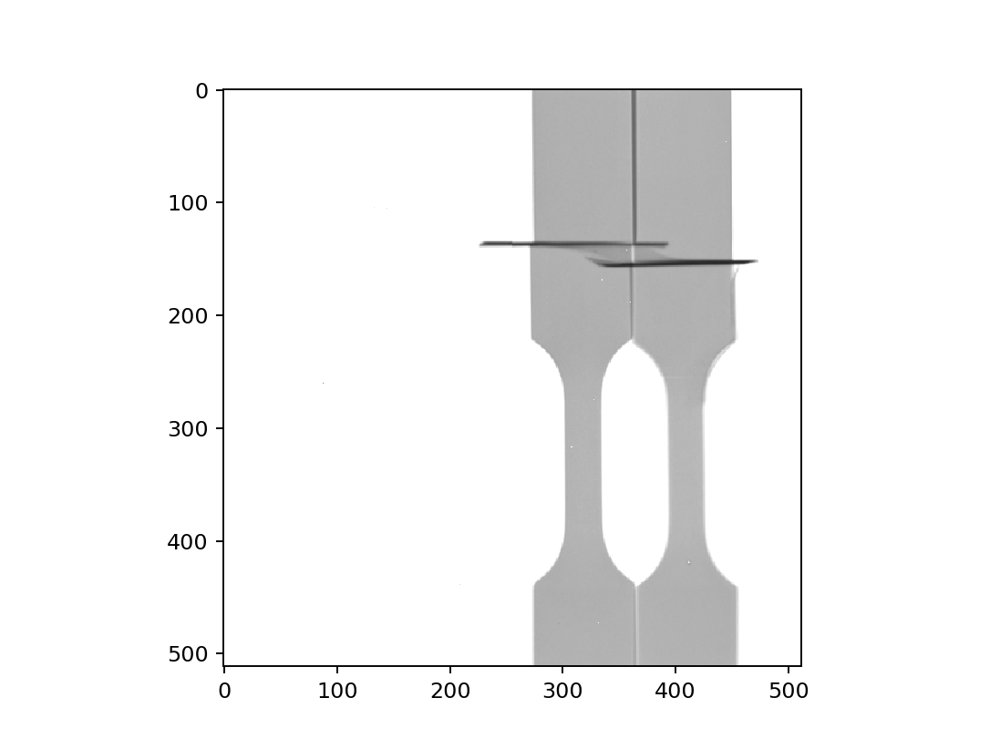

/home/carminati_c/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: divide by zero encountered in true_divide
/home/carminati_c/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: invalid value encountered in true_divide


<IPython.core.display.Javascript object>


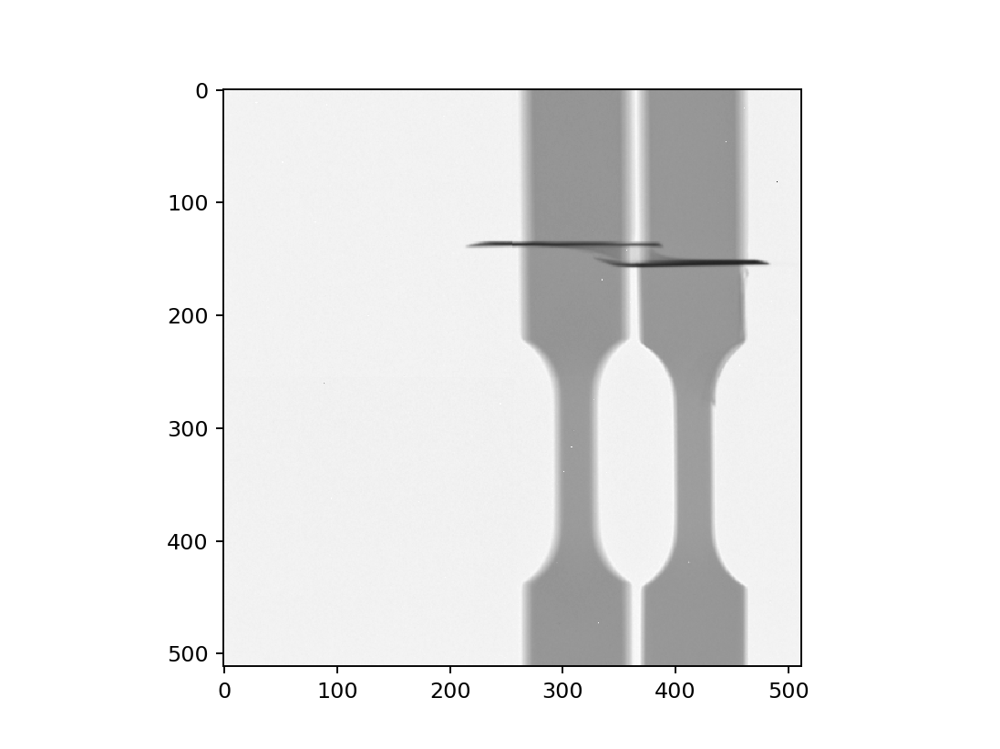

<IPython.core.display.Javascript object>


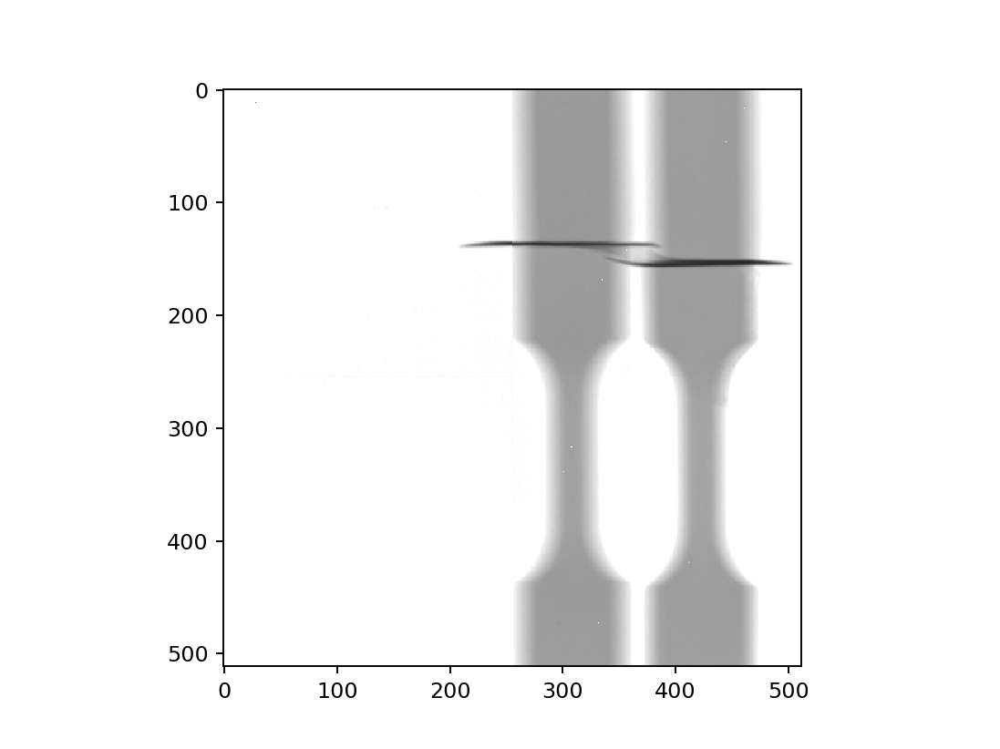

<IPython.core.display.Javascript object>


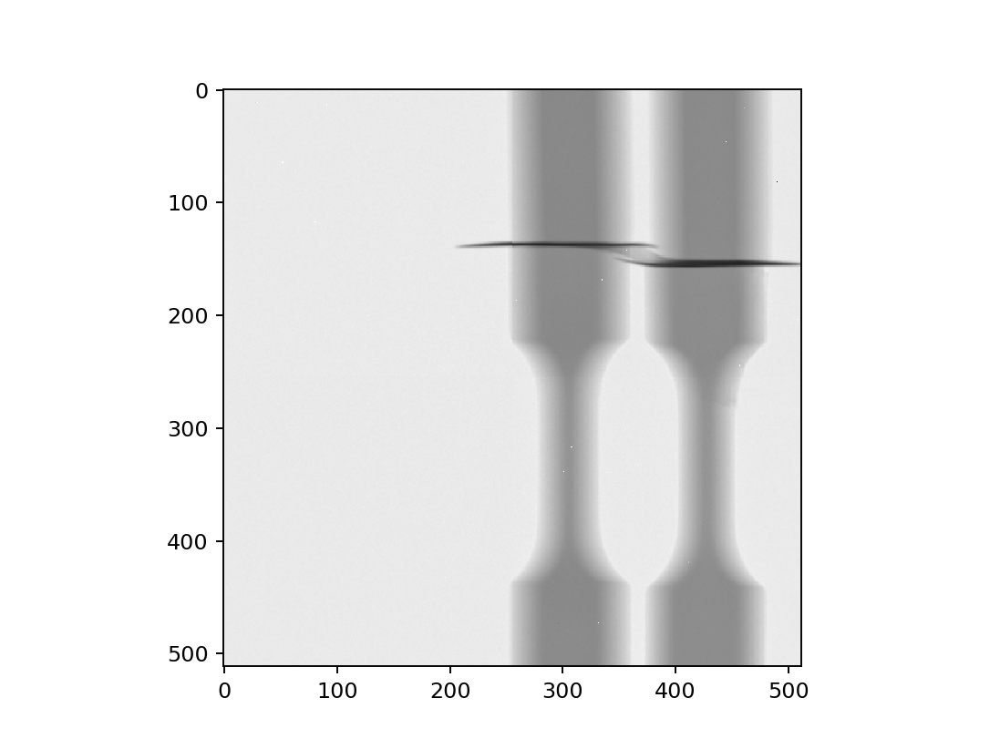

<IPython.core.display.Javascript object>


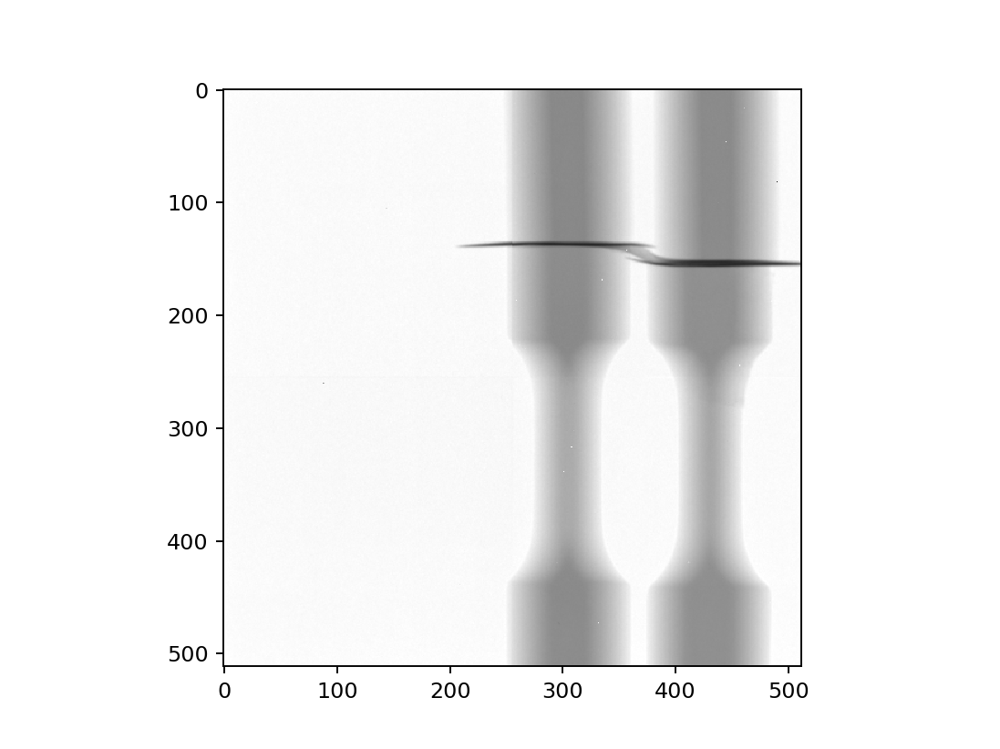

<IPython.core.display.Javascript object>


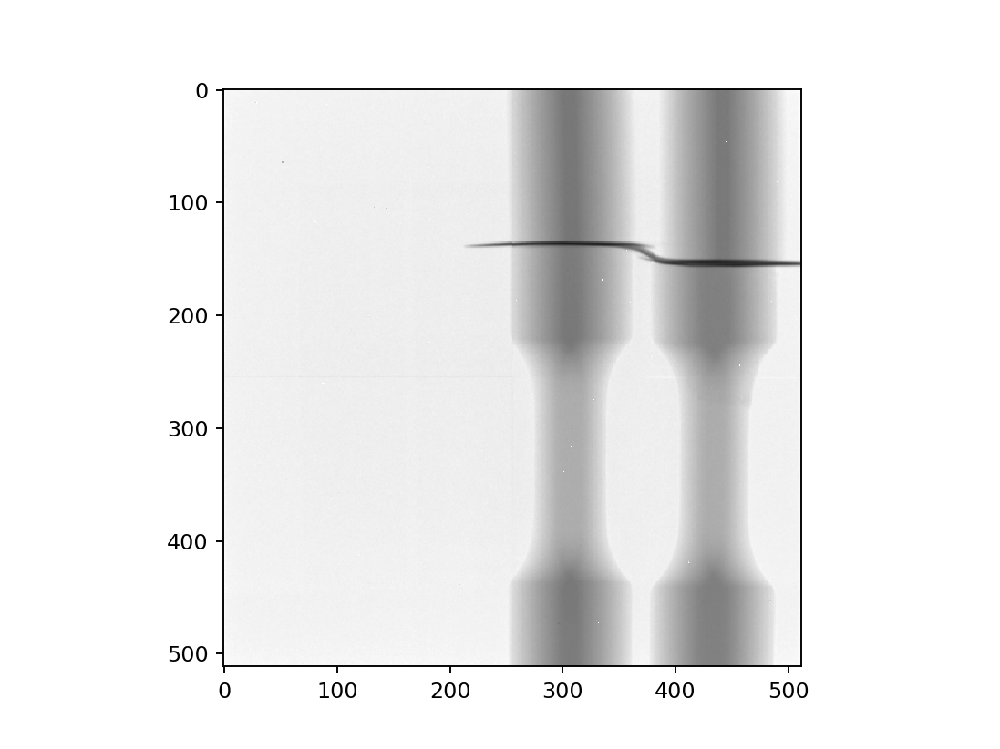

<IPython.core.display.Javascript object>


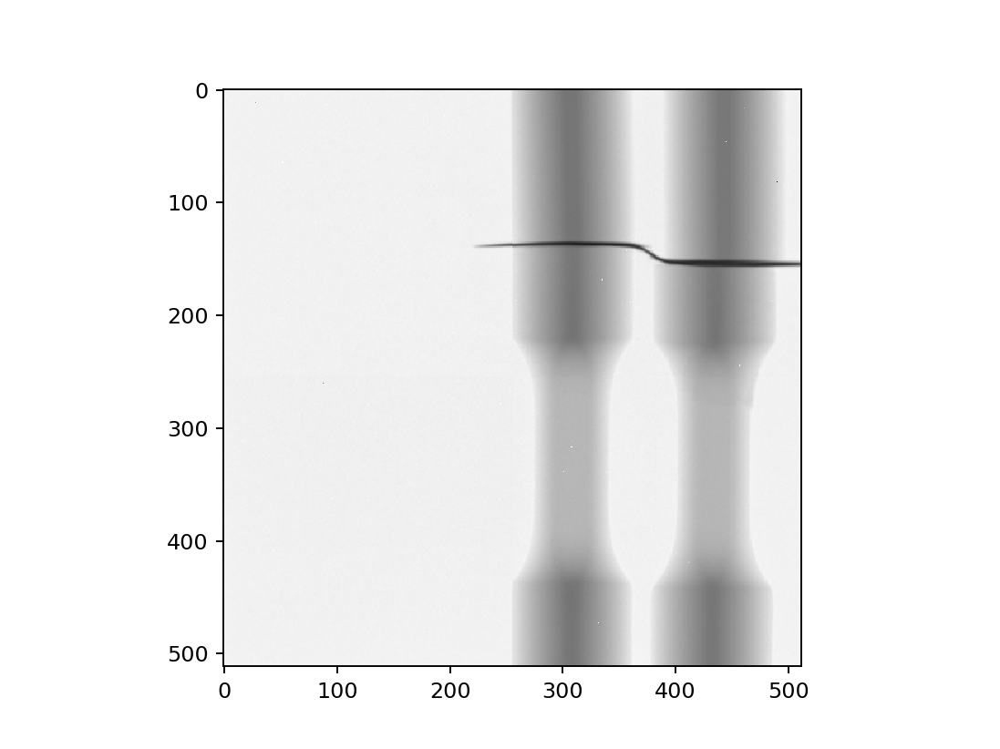

<IPython.core.display.Javascript object>


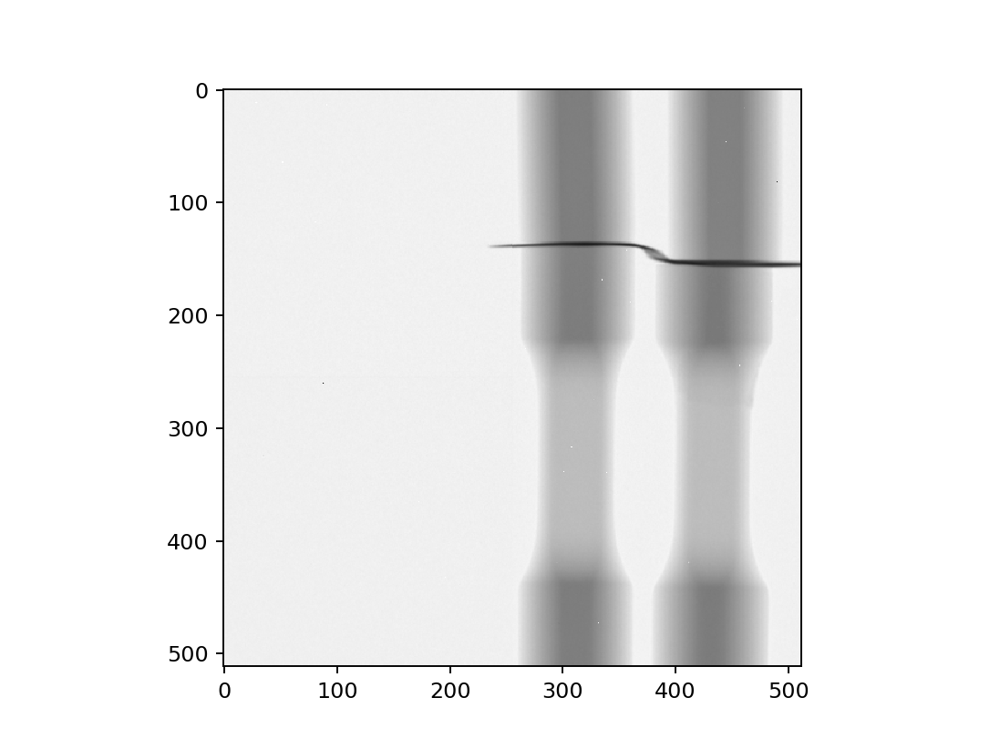

<IPython.core.display.Javascript object>


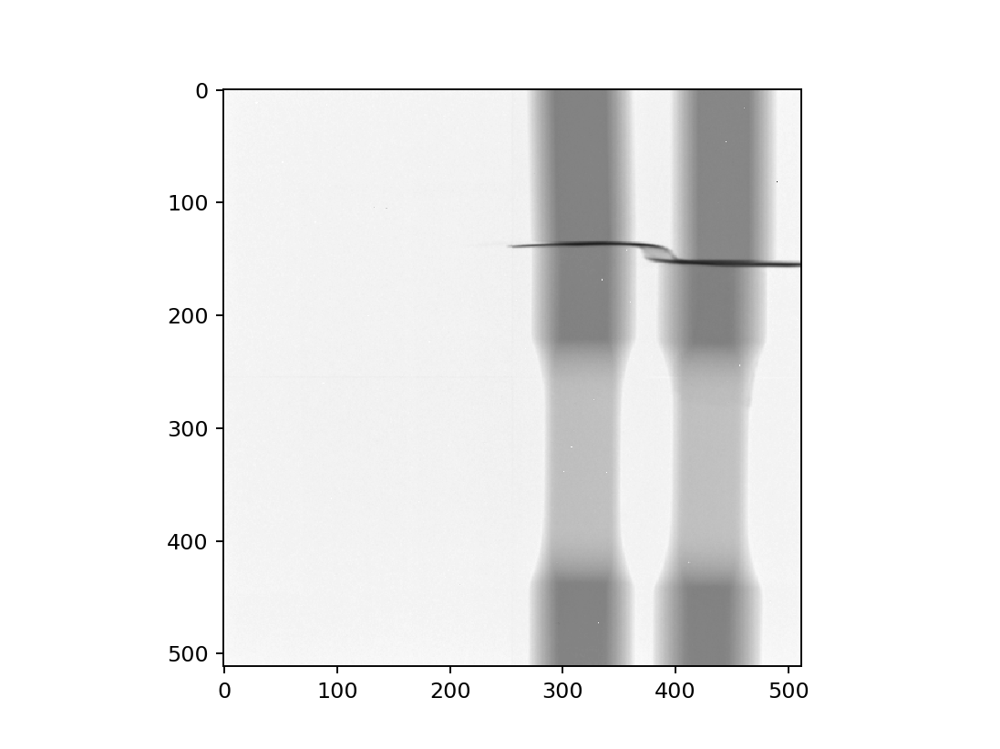

<IPython.core.display.Javascript object>


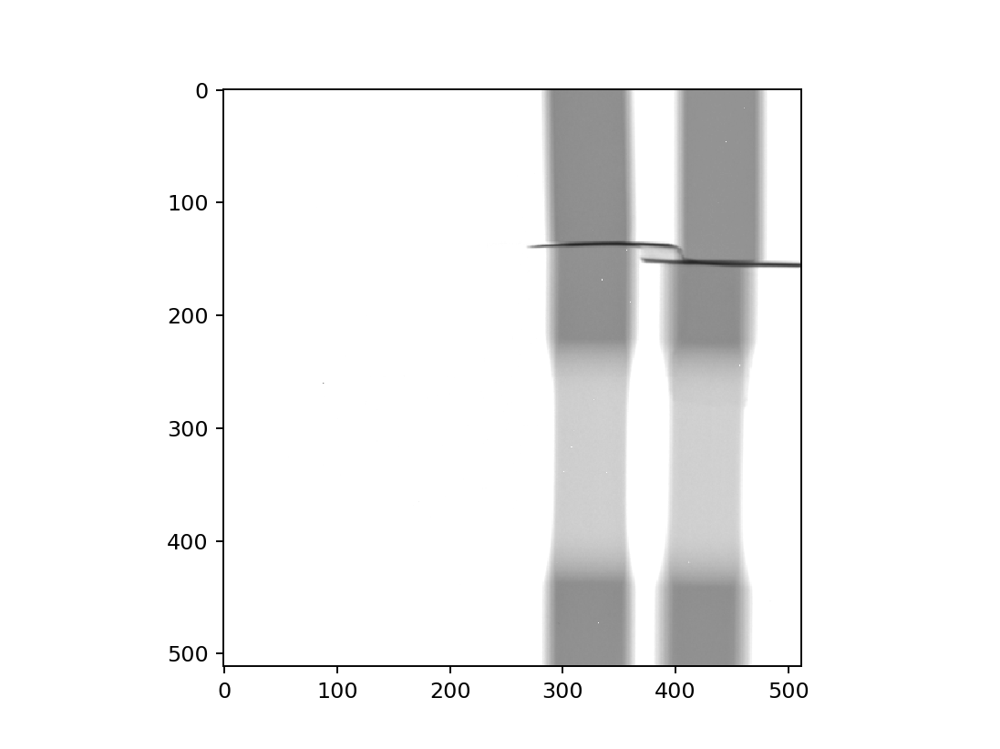

<IPython.core.display.Javascript object>


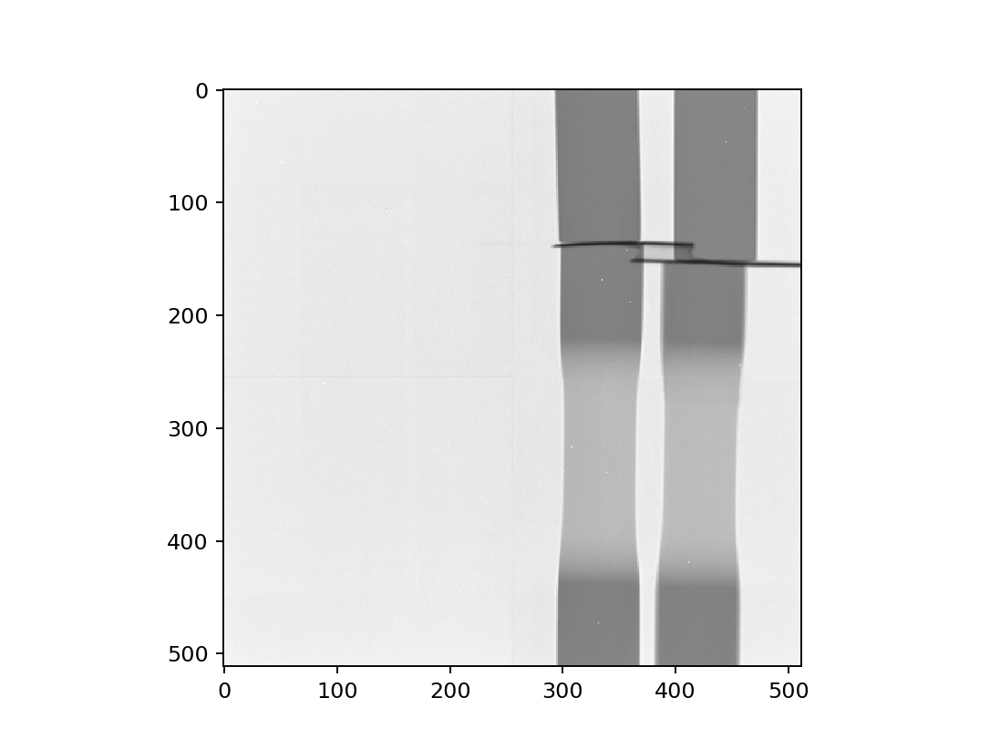

<IPython.core.display.Javascript object>


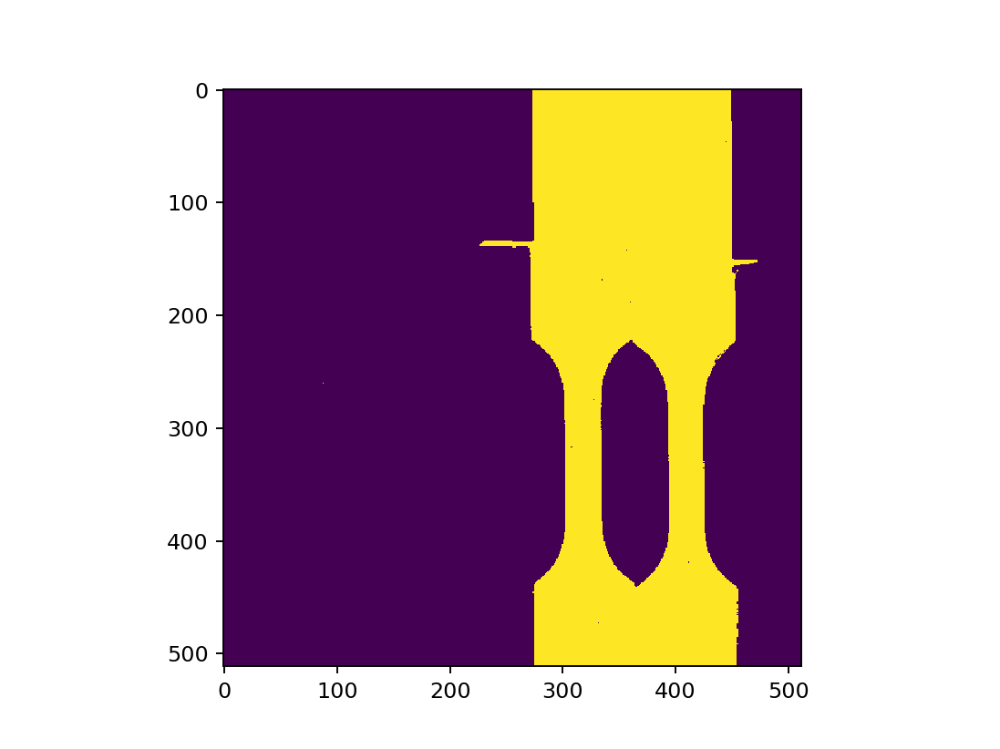

<IPython.core.display.Javascript object>


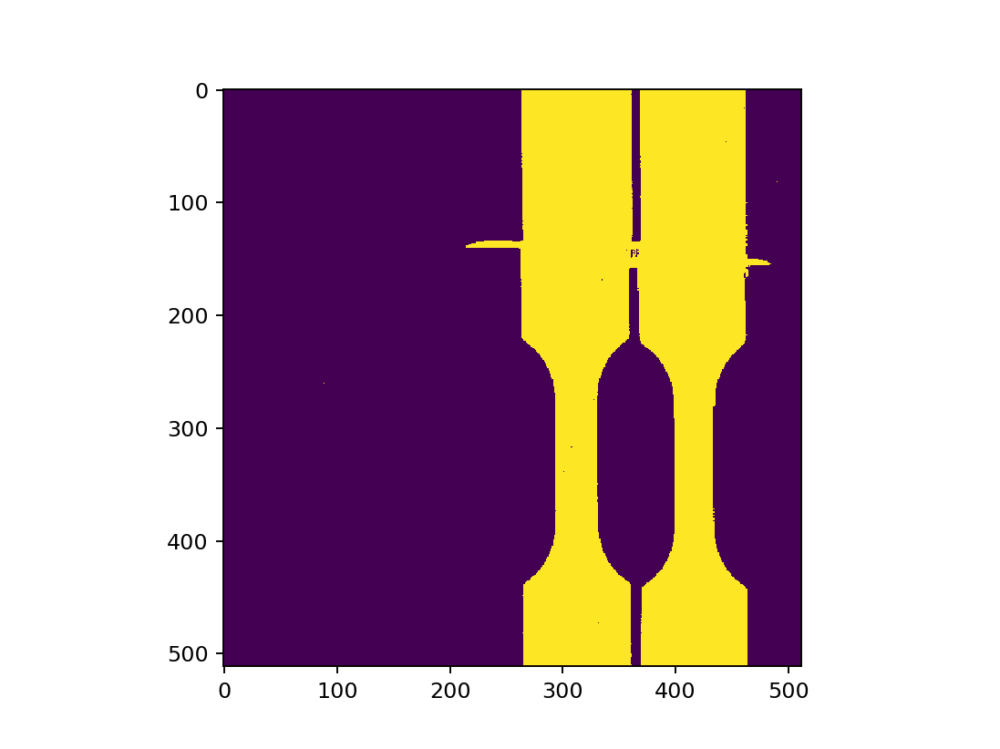

<IPython.core.display.Javascript object>


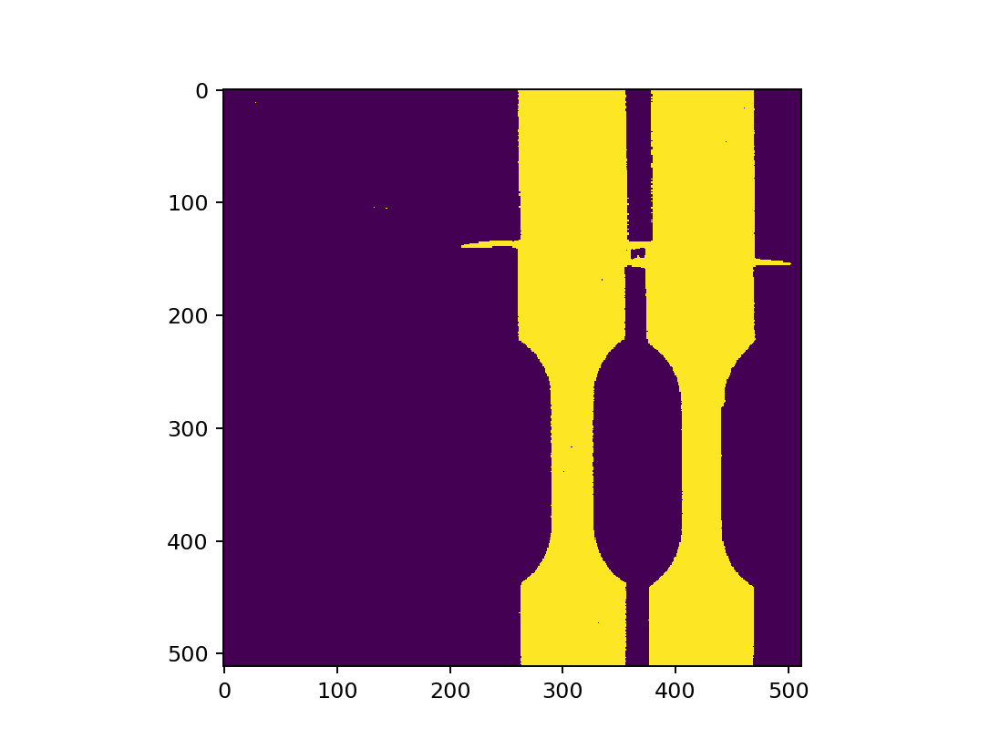

<IPython.core.display.Javascript object>


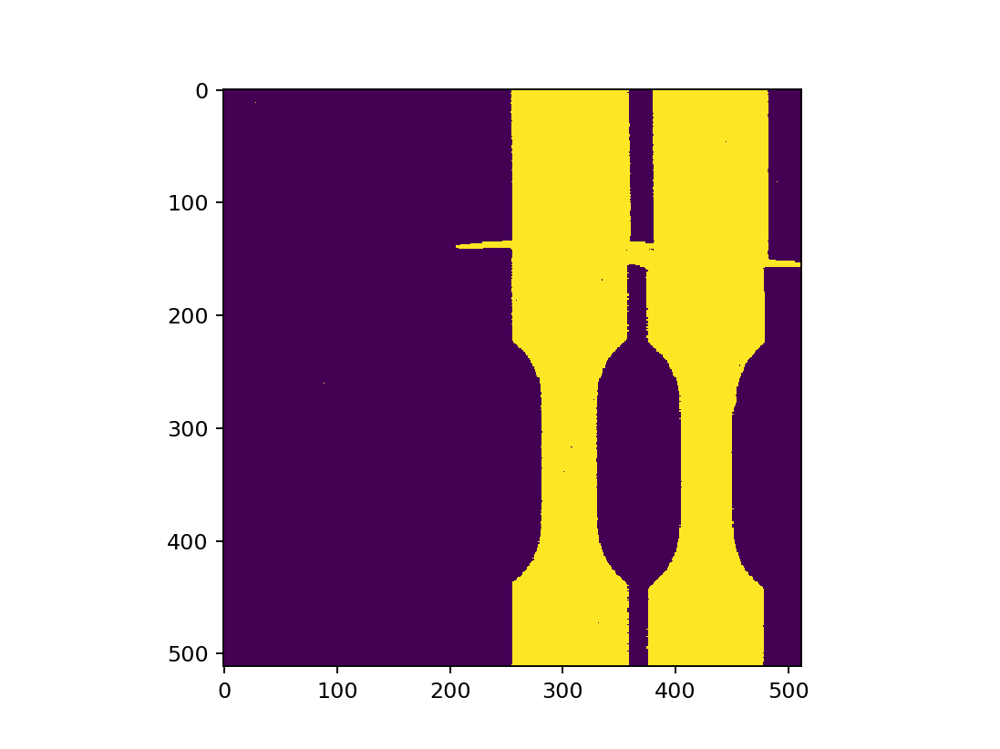

<IPython.core.display.Javascript object>


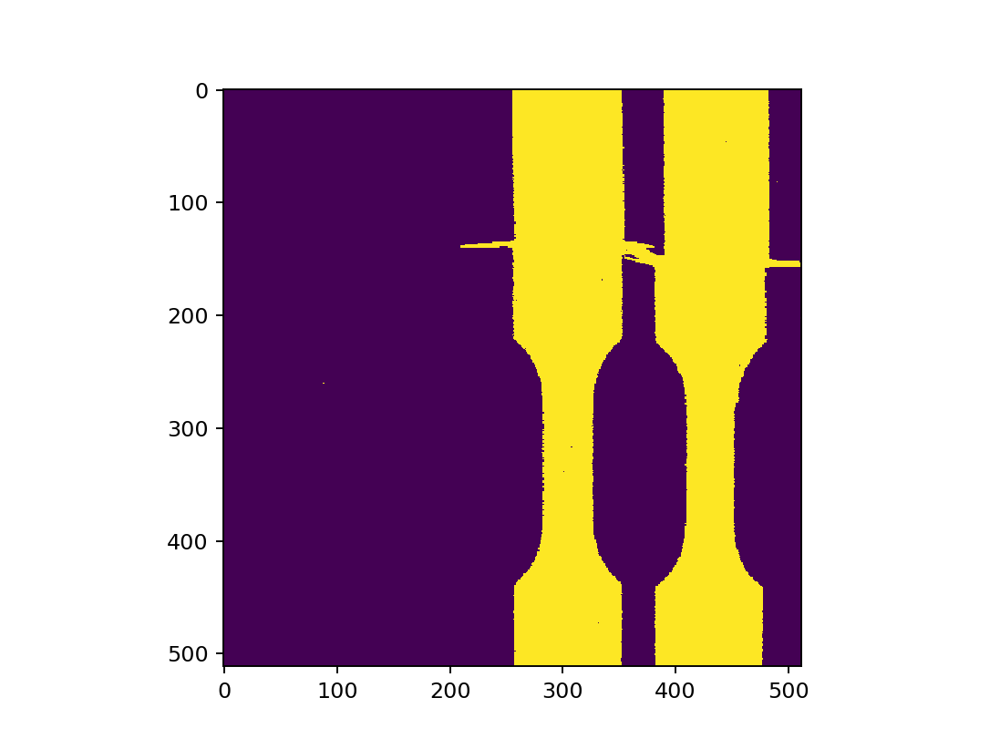

<IPython.core.display.Javascript object>


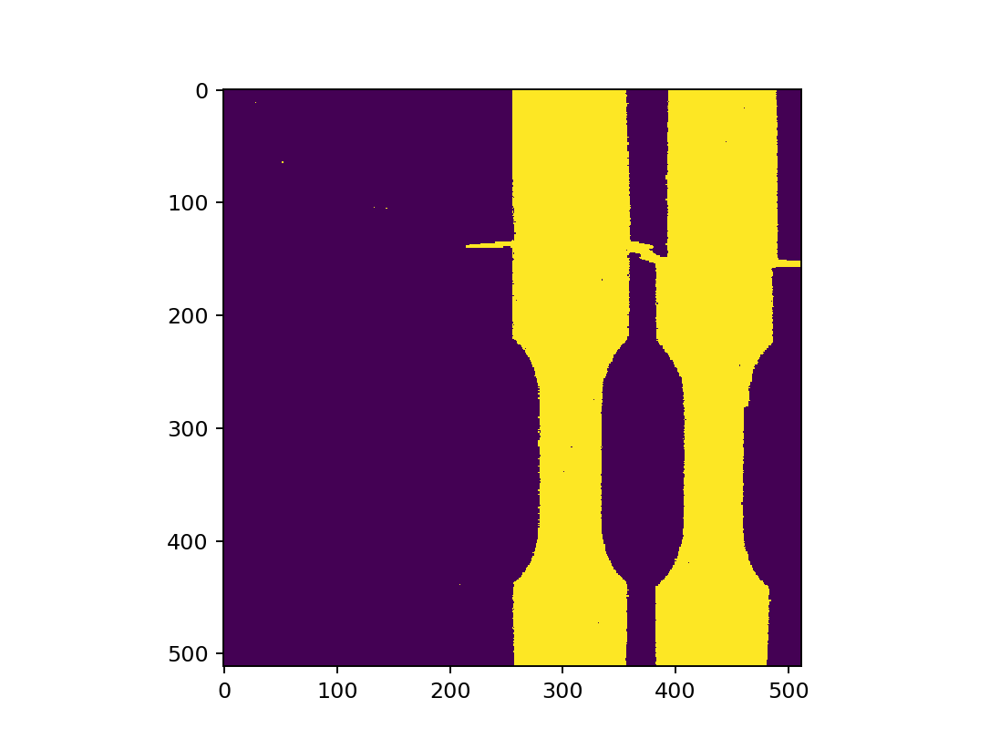

<IPython.core.display.Javascript object>


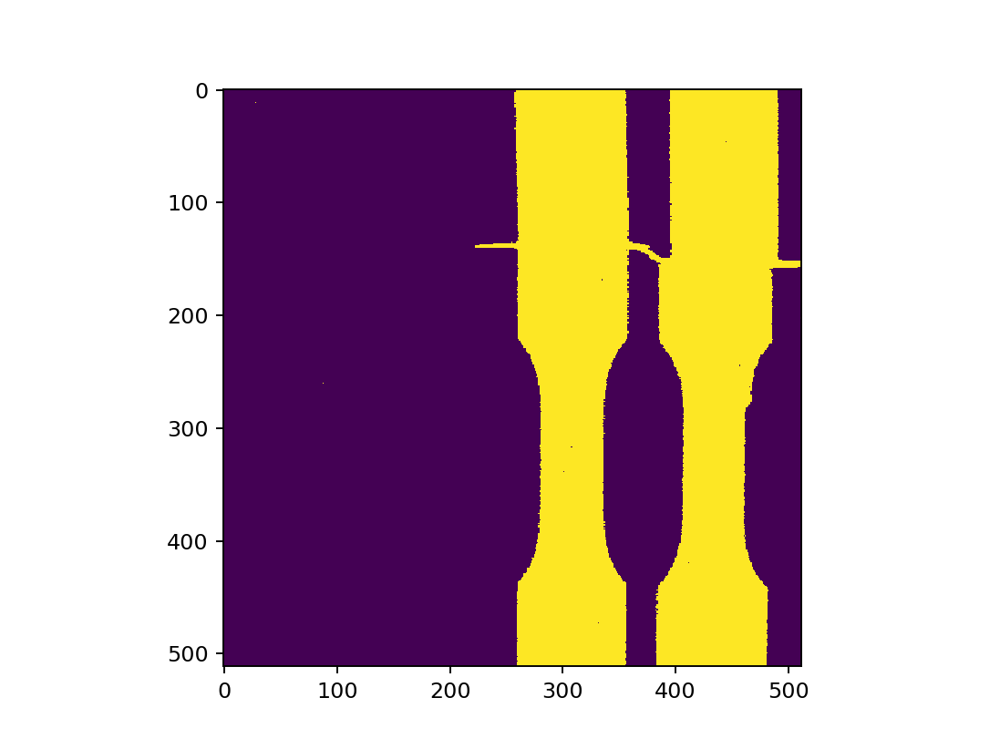

<IPython.core.display.Javascript object>


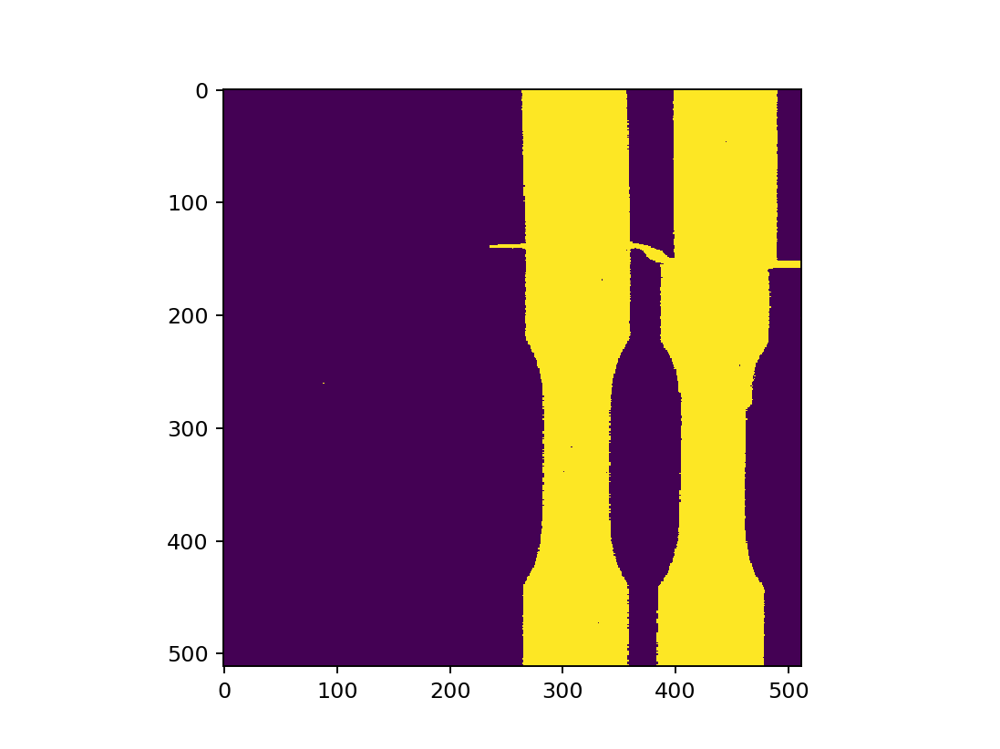

<IPython.core.display.Javascript object>


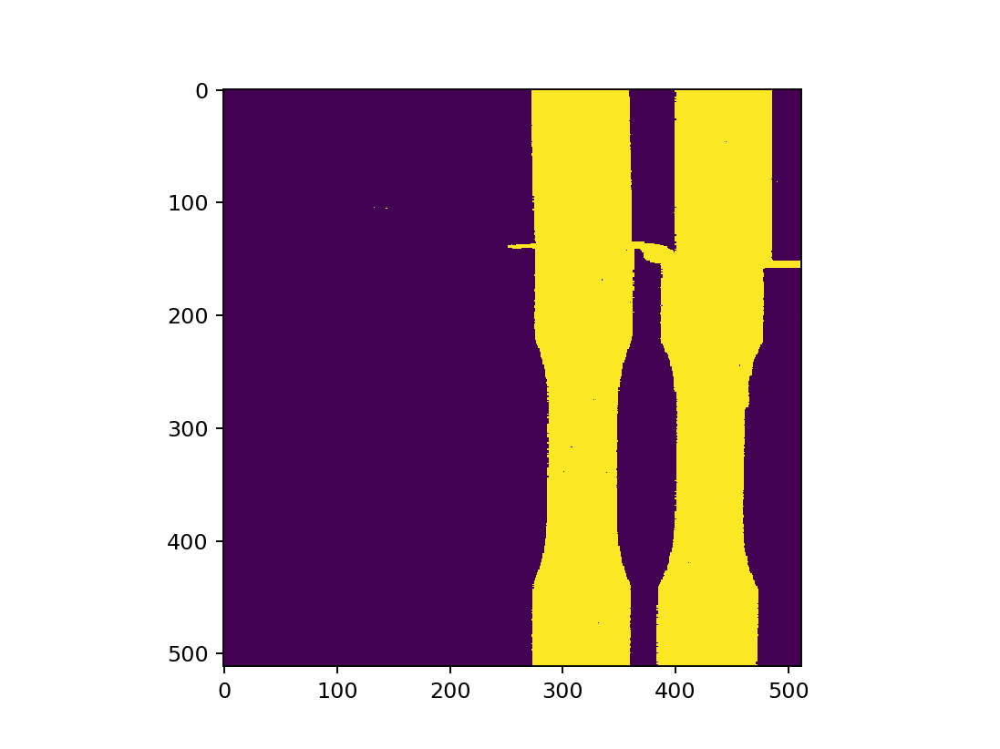

<IPython.core.display.Javascript object>


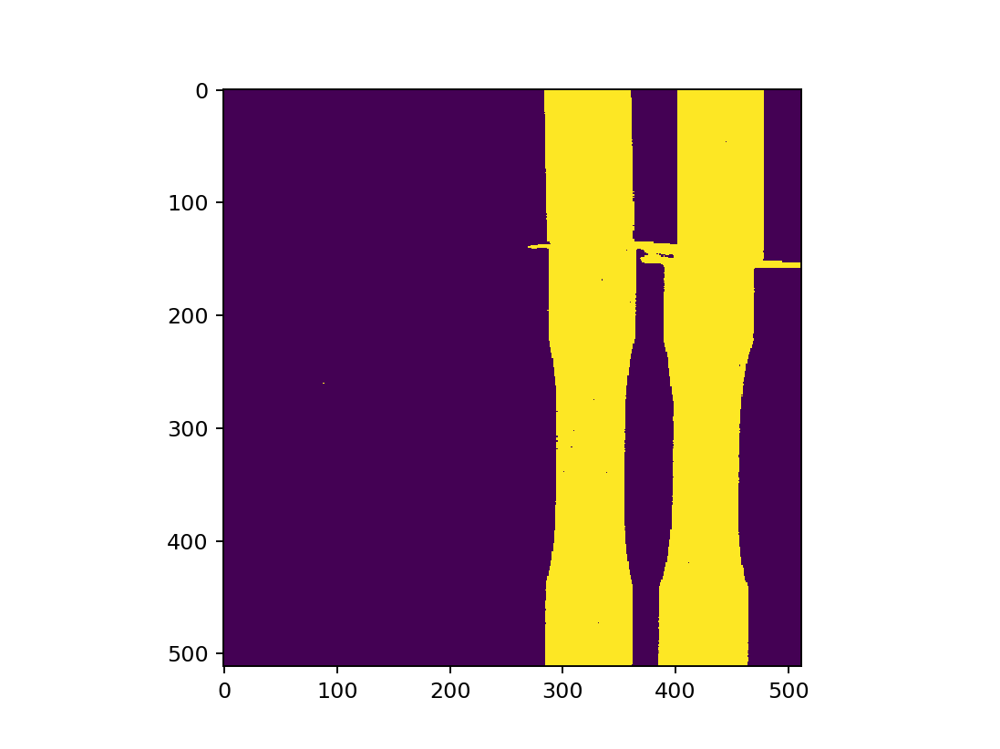

<IPython.core.display.Javascript object>


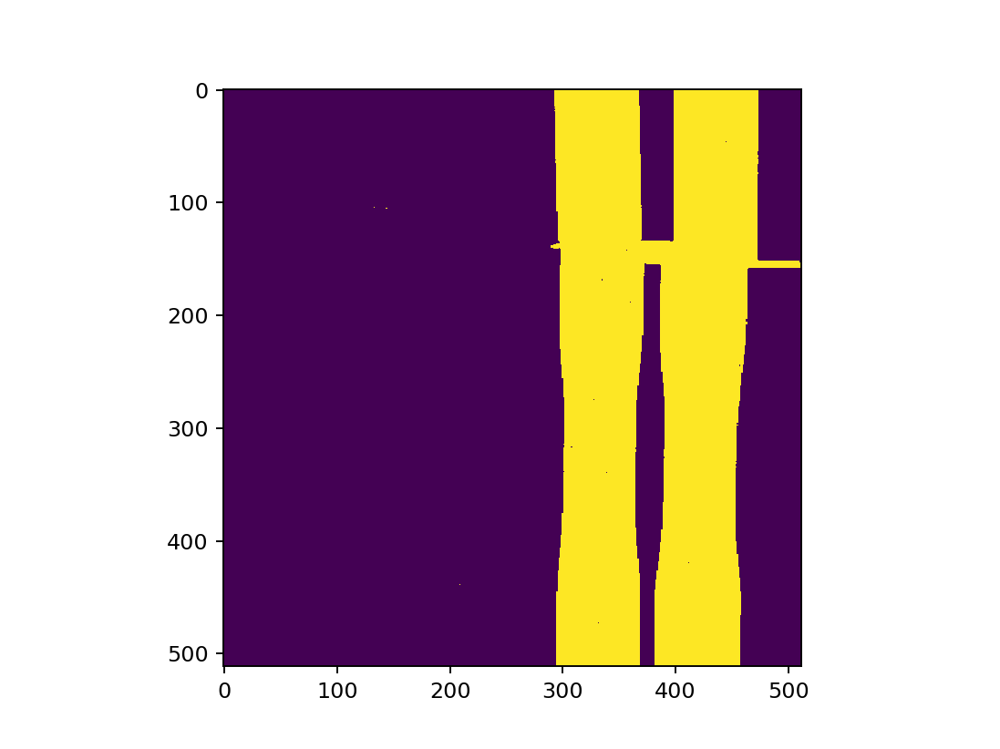

In [55]:
# Here I read the white beam images from which to compute the image mask. Let's try
path_WB = '/media/carminati_c/Data2/IMAT_Nov2018/03_VerticalSetting_3hruns/Summed_imgs/'
myfiles = sorted(fnmatch.filter(listdir(path_WB),'Summed_img*.fits'))
print(myfiles)

myproj=np.zeros([11,512,512])
proj_norm = np.zeros([11,512,512])
mask = np.zeros([11,512,512])

        
with fits.open('/media/carminati_c/Data2/IMAT_Nov2018/03_VerticalSetting_3hruns/Summed_imgs/Summed_ob_01.fits') as f:
    ob_wb = f[0].data

for i in range(0, len(myfiles)):
    with fits.open(path_WB+myfiles[i]) as f:
        myproj[i] = f[0].data
        proj_norm[i] = myproj[i]/ob_wb
        mask[i] = proj_norm[i] < 0.85

for i in range(0, len(myfiles)):
    plt.figure()
    plt.imshow(myproj[i]/ob_wb, cmap='gray', vmin=0.0, vmax=1.0)
    
for i in range(0, len(myfiles)):
    plt.figure()
    plt.imshow(mask[i])
